# Quality Check


In [48]:
#pip install ipywidgets matplotlib ipympl

In [80]:
import glob
import os
import json
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
import itertools

from pathlib import Path
from datetime import datetime

In [181]:
def create_interactive_viewer(main_path,onset, batch_size):
    plt.ion()
    
    patient_dirs = [d for d in os.listdir(main_path) 
                   if os.path.isdir(os.path.join(main_path, d))]
    
    patient_dirs=sorted(patient_dirs)
    patient_dirs=list(patient_dirs[onset:onset+batch_size])
    
    for patient_id in patient_dirs:
        patient_path = os.path.join(main_path, patient_id)
        timepoint_dirs = [d for d in os.listdir(patient_path) 
                         if os.path.isdir(os.path.join(patient_path, d))]
        
        for timepoint in timepoint_dirs:
            timepoint_path = os.path.join(patient_path, timepoint)
            nifti_files = [f for f in os.listdir(timepoint_path) if f.endswith('.nii.gz')]
            
            
            if not nifti_files:
                continue
            nifti_files=sorted(nifti_files)
            n_files = len(nifti_files)
            n_cols = min(3, n_files)
            n_rows = (n_files + n_cols - 1) // n_cols
            
            fig = plt.figure(figsize=(5*n_cols, 5*n_rows))
            
            def on_key(event, ax, img_data, title, voxel_dims):
                if event.key == 'up':
                    ax.index = min(ax.index + 1, img_data.shape[2] - 1)
                elif event.key == 'down':
                    ax.index = max(ax.index - 1, 0)
                
                ax.images[0].set_array(img_data[:, :, ax.index].T)
                ax.set_title(f'{title}\nSlice: {ax.index}/{img_data.shape[2]-1}\nVoxel size: {voxel_dims:.2f}mm')
                fig.canvas.draw_idle()
            
            for idx, nifti_file in enumerate(nifti_files):
                ax = fig.add_subplot(n_rows, n_cols, idx + 1)
                
                file_path = os.path.join(timepoint_path, nifti_file)
                img = nib.load(file_path)
                data = img.get_fdata()
                
                # Get voxel dimensions
                voxel_dims = np.array(img.header.get_zooms())
                voxel_size_str = f"{voxel_dims[0]:.2f} x {voxel_dims[1]:.2f} x {voxel_dims[2]:.2f}"
                
                ax.index = data.shape[2] // 2
                ax.imshow(data[:, :, ax.index].T, cmap='gray')
                ax.set_title(f'{nifti_file}\nSlice: {ax.index}/{data.shape[2]-1}\nVoxel size: {voxel_size_str}mm')
                
                fig.canvas.mpl_connect('key_press_event', 
                                     lambda event, ax=ax, data=data, title=nifti_file, voxel_dims=voxel_size_str: 
                                     on_key(event, ax, data, title, voxel_dims))
            
            plt.suptitle(f'Patient: {patient_id} - Timepoint: {timepoint}')
            plt.tight_layout()
            plt.show()

In [217]:
with open('QC_setup.json', 'r') as f:
    params = json.load(f)
params

{'mri_mod': 'T1_C',
 'mri_sites': {'site1': 'UCSF-PDGM',
  'site2': 'LUMIERE',
  'site3': 'CCF',
  'site4': 'IVYGAP',
  'site5': 'xCures',
  'site6': 'TCGA-GBM'},
 'mri_data': 'site6',
 'subdirs': {'subdir1': 'Raw_nifti',
  'subdir2': 'Preprocessed',
  'subdir3': '_Preprocessed_UPenn'},
 'subdir_data': 'subdir3',
 'root_path': '/app/Data/_Brain/Radiology/_Adult/_Glioma',
 'output_folder': 'Metadata',
 'id1': 0,
 'batch_size': 5,
 'batch': '01',
 'port': '92'}

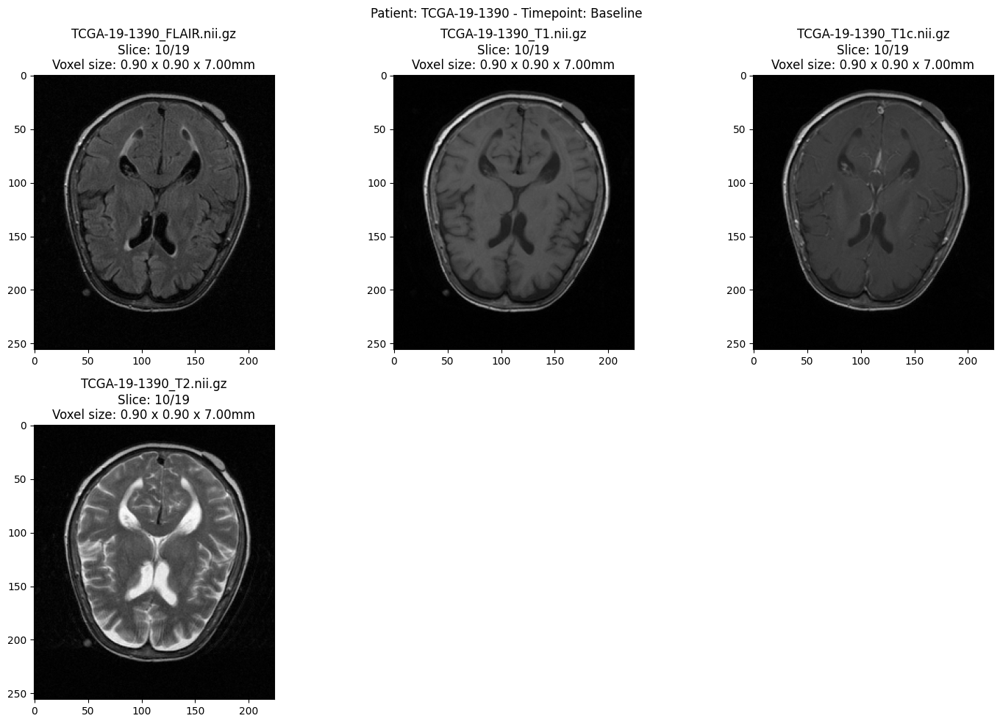

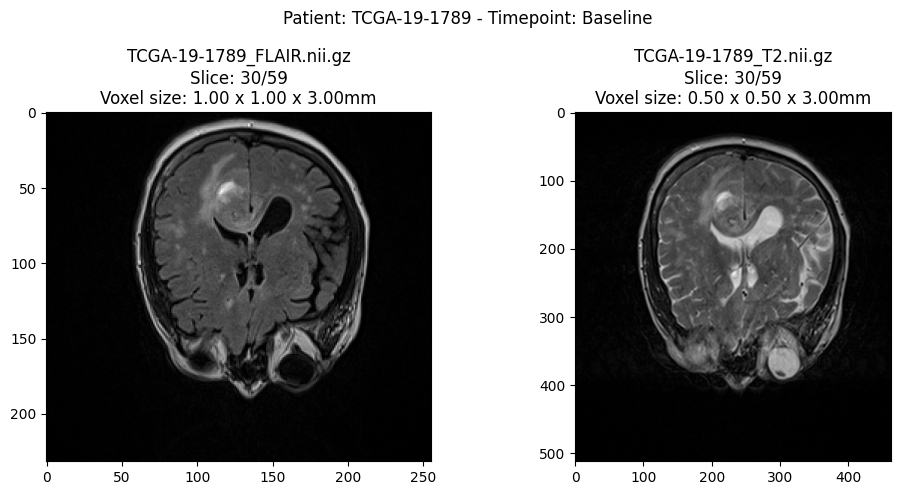

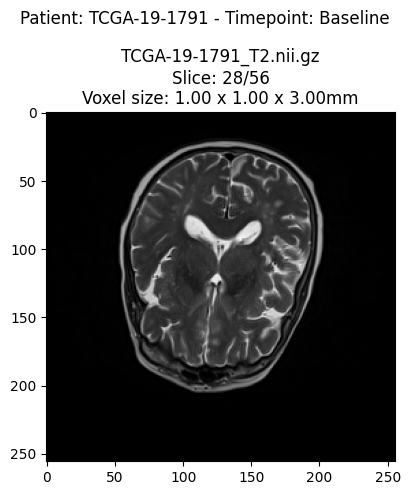

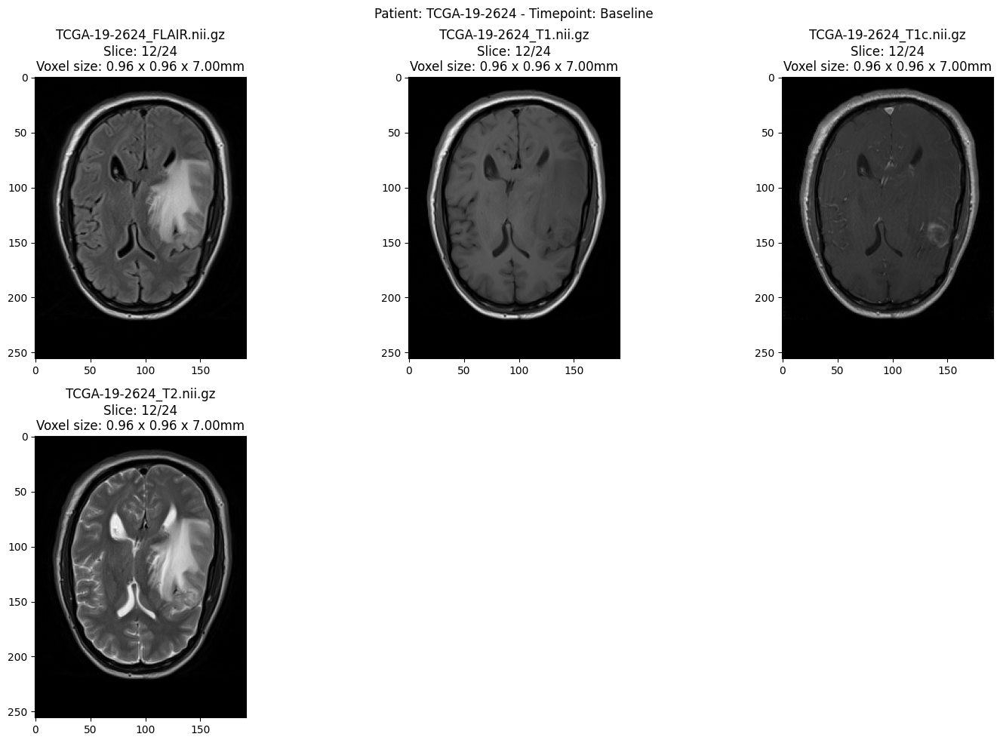

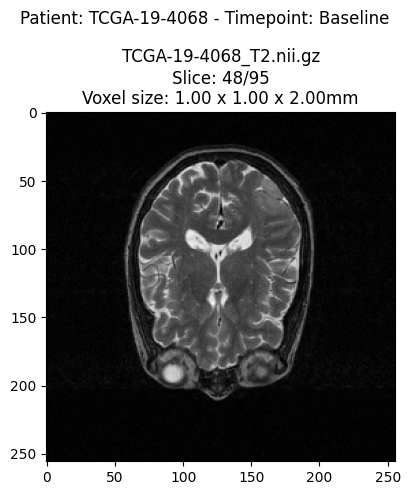

...

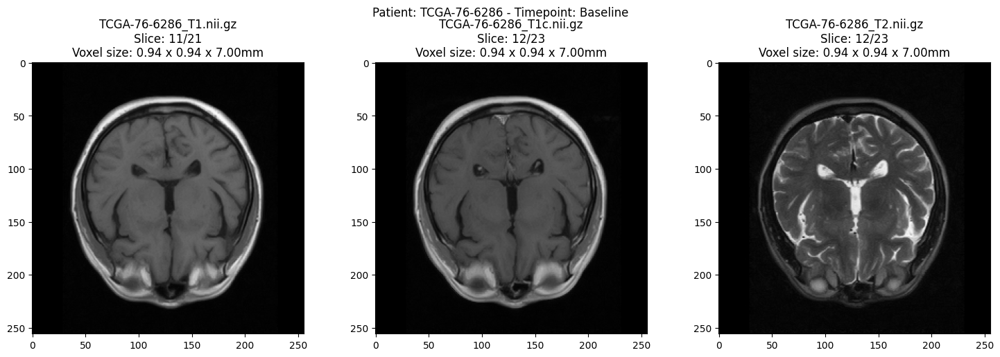

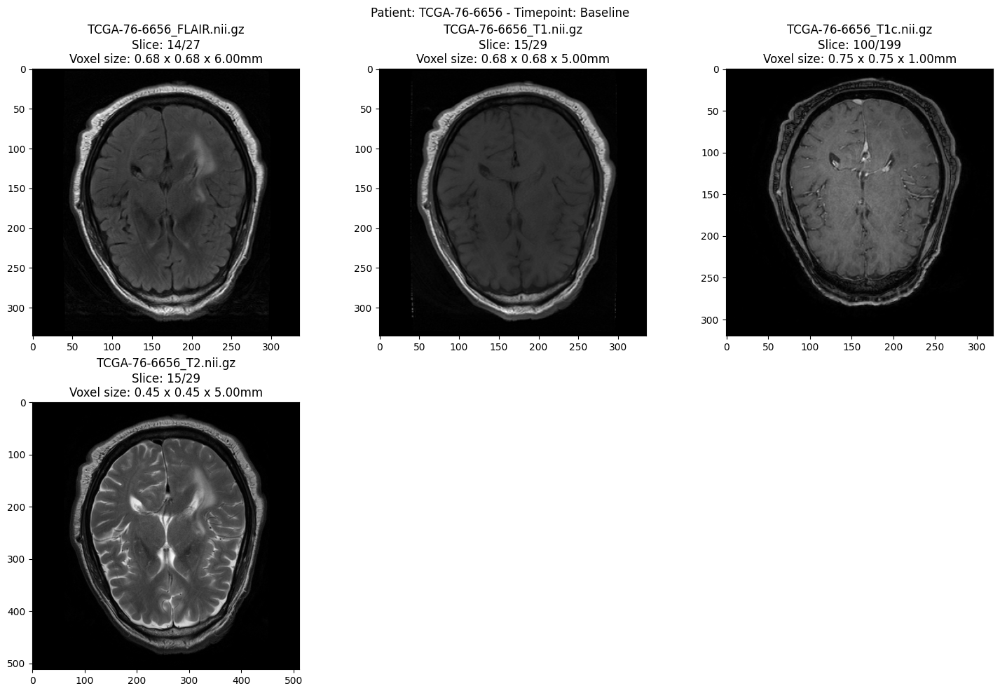

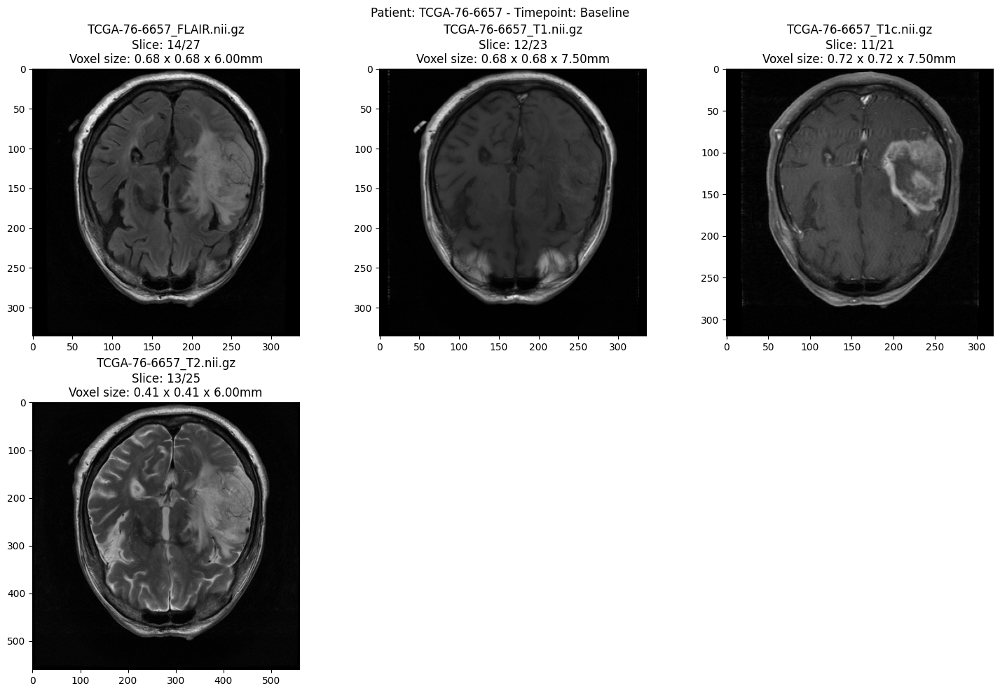

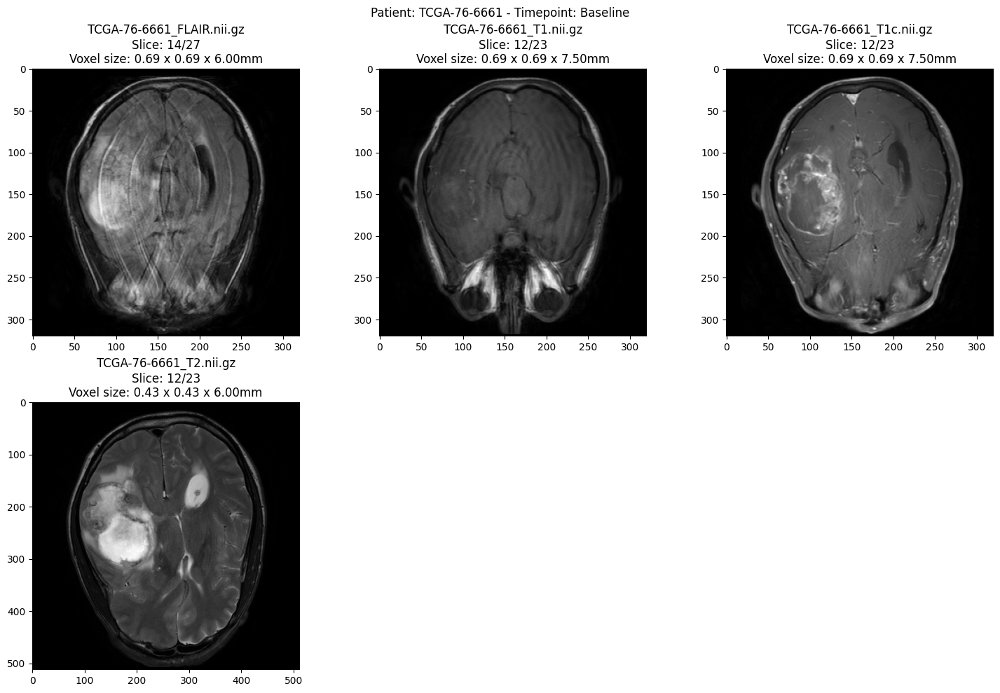

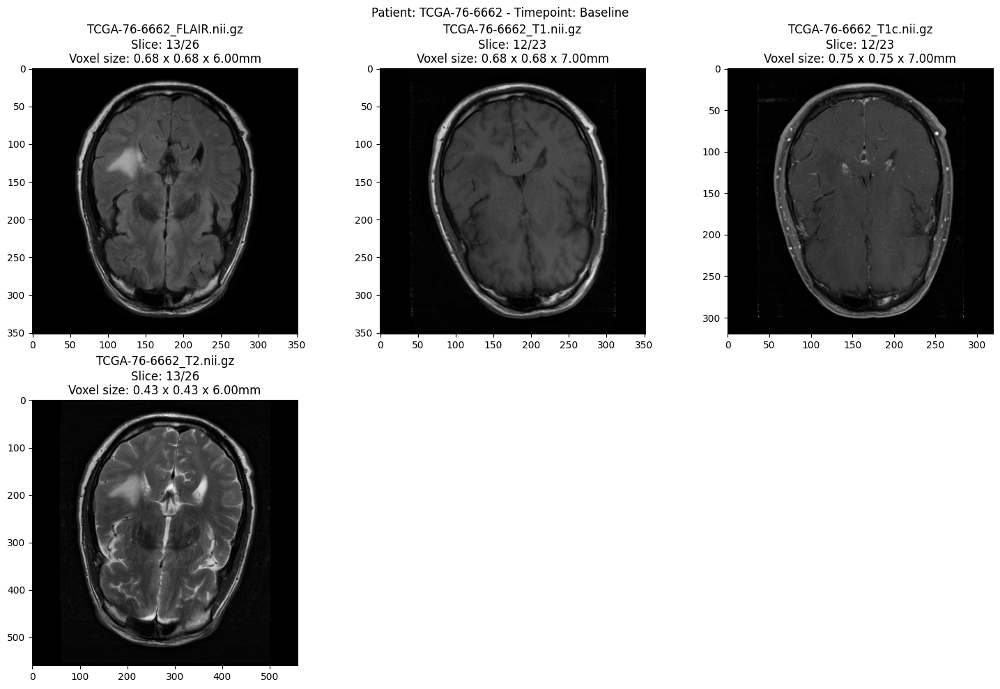

In [221]:
subdir="Preprocessed"
main_path=os.path.join(root_path,mri_data,subdir)
create_interactive_viewer(main_path,180,38)

# Match TCGA IDS

In [14]:
trees=["drAmit","drHill","Original Scans","training set"]
tree_parent="_Preprocessed_GBM_Hypoxia_Validation"
df_tree=[]
tree_names=[]
for subdir in trees:
    main_path=os.path.join(root_path,mri_data,tree_parent,subdir)
    folders_df = find_tcga_dirs(main_path)
    folders_df = folders_df.drop_duplicates()
    sorted_df = folders_df.sort_values('TCGA_paths')
    names=f"{tree_parent}_/_{subdir}"
    print(f"number of cases {folders_df.shape}")
    df_tree.append(sorted_df)
    tree_names.append(names)

number of cases (36, 1)
number of cases (30, 1)
number of cases (33, 1)
number of cases (0, 1)


In [15]:
trees=["IDHcodel","IDHnoncodel","IDHWT"]
tree_parent="_Preprocessed_TCIA/ASCO2018_IDH mutation status"
df_tree2=[]
tree_names2=[]
for subdir in trees:
    main_path=os.path.join(root_path,mri_data,tree_parent,subdir)
    folders_df = find_tcga_dirs(main_path)
    folders_df = folders_df.drop_duplicates()
    sorted_df = folders_df.sort_values('TCGA_paths')
    names=f"{tree_parent}_/_{subdir}"
    print(f"number of cases {folders_df.shape}")
    df_tree2.append(sorted_df)
    tree_names2.append(names)
tree_names2
df_tree2[-1]

number of cases (13, 1)
number of cases (44, 1)
number of cases (91, 1)


,TCGA_paths
26,TCGA-02-0006
44,TCGA-02-0009
88,TCGA-02-0011
1,TCGA-02-0027
48,TCGA-02-0033
...,...
17,TCGA-DU-8162
64,TCGA-DU-A5TT
81,TCGA-DU-A5TY
72,TCGA-FG-6692


In [16]:
subdirs=['DICOM_restructured',"_DICOM_raw","_Preprocessed_Ruchika-GBM","_Preprocessed_DiffuseGliomas_GBM","_Preprocessed_MNI","_Preprocessed_UPenn"]
# As a DataFrame
df_list=[]
for subdir in subdirs:
    main_path=os.path.join(root_path,mri_data,subdir)
    folders_df = pd.DataFrame({'IDS': sorted([f for f in os.listdir(main_path) if os.path.isdir(os.path.join(main_path, f))])})
    print(f"number of cases {folders_df.shape}")
    df_list.append(folders_df)

number of cases (205, 1)
number of cases (142, 1)
number of cases (103, 1)
number of cases (102, 1)
number of cases (68, 1)
number of cases (102, 1)


In [17]:
df_list.insert(0, whole_dataset)
df_list=df_list + df_tree + df_tree2
print(len(df_list))
new_dirs =  ['whole_dataset']
new_dirs=new_dirs+subdirs +tree_names +tree_names2

14


,whole_dataset_n_260,DICOM_restructured_n_205,_DICOM_raw_n_142,_Preprocessed_Ruchika-GBM_n_103,_Preprocessed_DiffuseGliomas_GBM_n_102,_Preprocessed_MNI_n_68,_Preprocessed_UPenn_n_102,_Preprocessed_GBM_Hypoxia_Validation_/_drAmit_n_36,_Preprocessed_GBM_Hypoxia_Validation_/_drHill_n_30,_Preprocessed_GBM_Hypoxia_Validation_/_Original Scans_n_33,_Preprocessed_GBM_Hypoxia_Validation_/_training set_n_0,_Preprocessed_TCIA/ASCO2018_IDH mutation status_/_IDHcodel_n_13,_Preprocessed_TCIA/ASCO2018_IDH mutation status_/_IDHnoncodel_n_44,_Preprocessed_TCIA/ASCO2018_IDH mutation status_/_IDHWT_n_91
TCGA-02-0003,TCGA-02-0003,TCGA-02-0003,TCGA-02-0003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TCGA-02-0006,TCGA-02-0006,TCGA-02-0006,TCGA-02-0006,TCGA-02-0006,TCGA-02-0006,NaN,TCGA-02-0006,NaN,NaN,NaN,NaN,NaN,NaN,TCGA-02-0006
TCGA-02-0009,TCGA-02-0009,TCGA-02-0009,TCGA-02-0009,TCGA-02-0009,TCGA-02-0009,NaN,TCGA-02-0009,NaN,NaN,NaN,NaN,NaN,NaN,TCGA-02-0009
TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,TCGA-02-0011,NaN,NaN,NaN,TCGA-02-0011
TCGA-02-0027,TCGA-02-0027,TCGA-02-0027,TCGA-02-0027,TCGA-02-0027,TCGA-02-0027,NaN,TCGA-02-0027,NaN,NaN,NaN,NaN,NaN,NaN,TCGA-02-0027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-HT-8111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TCGA-HT-8111,NaN
TCGA-HT-8114,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TCGA-HT-8114,NaN
TCGA-HT-8563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TCGA-HT-8563,NaN
TCGA-HT-A61A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TCGA-HT-A61A,NaN


In [19]:
merged_df.to_csv("TCGA_tree_RadDrive_WISC.csv")